# Humpback Whale Fluke Detection using Pytorch

In this notebook we'll fine-tune a pre-trained neural network to detect and localize humpback whale flukes in images from the [Kaggle Humpback Whale Identification Challenge](https://www.kaggle.com/c/humpback-whale-identification). 
The ground truth bounding box labels for a selection of 800 images from the training dataset provided by the challenge were created using [Bounding Box Editor](https://github.com/mfl28/BoundingBoxEditor), a Java-Desktop application which you can find in my github repositories. You can find my annotation files in the *data* folder. 

The basic workflow for an object detection project (using bounding boxes) can be described as follows:
1. Get images containing objects you want to detect (here the images are a subset of the training set of the [Humpback Whale Identification Challenge](https://www.kaggle.com/c/humpback-whale-identification) on [Kaggle](https://www.kaggle.com/), we intend to predict the location of humpback whale flukes).
2. Annotate the images with bounding boxes using a image annotation software (here [Bounding Box Editor](https://github.com/mfl28/BoundingBoxEditor) was used).
3. Choose a programming language and a deep learning framework (here we use Python and the Pytorch framework).
4. Load the data in a way that is compatible with the chosen framework (here we use a custom Dataset `VOCXMLDataset` which is part of my `mltools` library).
5. Create a neural network model to train on the dataset (here we use a Faster RCNN network which was pre-trained on the COCO-dataset (see [`torchvision.models.detection.faster_rcnn.fasterrcnn_resnet50_fpn`](https://pytorch.org/docs/master/_modules/torchvision/models/detection/faster_rcnn.html)) and replace its box prediction head with a different one which predicts objects of our own dataset's classes).
6. Choose hyperparameters for the model and train the model on the training set.
7. Evaluate the model on the test set.
8. If necessary, iterate on the previous steps until you are happy with the results.

The procedures used here have been adapted from the Pytorch tutorials  [Finetuning Torchvision Models](https://pytorch.org/tutorials/beginner/finetuning_torchvision_models_tutorial.html) and [Object Detection Finetuning](https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html) and can easily be modified to work with your own custom datasets. See also: [torchvision](https://github.com/pytorch/vision).

## Prerequesits

This notebook is intended to be run on [Google Colab](https://colab.research.google.com). 
Images and annotation-files were uploaded to my personal Google Drive, which I then mounted in this notebook. If you want to run this notebook on Google Colab you'll have to do the same using your own personal Google Drive.
If you want to run this notebook on your local machine or another cloud-computing platform, you'll have to change how the data is accessed, everything else should work as it is.

### Magics & Standard Imports

In [0]:
# Automatically reload modules that were changed externally.
%load_ext autoreload
%autoreload 2
# For better looking plots.
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys

import torch
import torchvision

# Torchvision model classes.
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor, fasterrcnn_resnet50_fpn

from torch.utils.data import Subset, DataLoader

from pathlib import Path
from PIL import Image


### Import custom library: mltools (VOCXMLDataset, transforms)

*Note*: *mltools* is a custom library that I created for machine learning tasks. It contains many useful functions and classes, such as the VOCXMLDataset class which we'll use in this notbook. 
You can find it in my [MachineLearning](https://github.com/mfl28/MachineLearning) repository. We'll clone this repo and add the created folder to the module search path:

In [0]:
!git clone https://github.com/mfl28/MachineLearning.git 

sys.path.insert(0,'MachineLearning')

Cloning into 'MachineLearning'...
remote: Enumerating objects: 28, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 28 (delta 6), reused 22 (delta 4), pack-reused 0
Unpacking objects: 100% (28/28), done.


In [0]:
from mltools.detection.datasets import VOCXMLDataset
from mltools.detection import transforms as T

### Mount Google Drive
To access the data files on Google Drive, we first have to mount it.

In [0]:
from google.colab import drive

drive.mount('/content/drive', force_remount=True)

In [0]:
# Files will be present in "/content/drive/My Drive". For this demo, 
# I have stored the needed data in the following folders in my 
# personal Google Drive:
project_root = Path("/content/drive/My Drive/Colab_ML/projects/Humpback_Fluke_Detection")
data_path = project_root / "data"

!ls "{data_path.resolve()}"

annotations  images


__Folders__:
* *annotations*: Contains all annotation XML-files in the Pascal VOC format.

In [0]:
!ls "{(data_path / "annotations").resolve()}" | head -5

0000e88ab_jpg_A.xml
00d1615b1_jpg_A.xml
018953e38_jpg_A.xml
01e58e831_jpg_A.xml
0215715b6_jpg_A.xml


* *images*: Contains (at least) the annotated images.

In [0]:
!ls "{(data_path / "images").resolve()}" | head -5

0000e88ab.jpg
00d1615b1.jpg
018953e38.jpg
01e58e831.jpg
0215715b6.jpg


*Note*: The image-files specified in the annotation-files in the *annotations* folder MUST exist in the *images* folder. However not all images in the *images* folder
have to have corresponding annotation-files in the *annotations* folder. That means you can download all the images from the Kaggle Humpback Identification challenge as well as my annotation files and `VOCXMLDataset`'s constructor will parse the annotation-files and figure out the annotated images automatically.

## Exploring the Data

### The VOCXMLDataset
At first we'll load the images and annotations into a custom Dataset. In this section we're only interested in looking at some of the samples and some of the methods of the VOCXMLDataset class, so for now, we do not specify any transforms for data-augmentation for the samples. For this, all we have to do is pass the root folder path of the data to the `VOCXMLDataset` constructor, it will then automatically parse the annotations to extract the classes and annotated images.

In [0]:
# Define dataset (might take some time when called for the first time):
dataset = VOCXMLDataset(root=data_path)
dataset

Dataset VOCXMLDataset
    Number of datapoints: 800
    Root location: /content/drive/My Drive/Colab_ML/projects/Humpback_Fluke_Detection/data
    Number of classes: 1
    Classes: ['Fluke']

In [0]:
# You can use the info_df (a pandas.DataFrame) member variable to look at some information about the data:
dataset.info_df.head()

,filename,width,height,nr_boxes,classes
0,0000e88ab.jpg,1050,700,1,{Fluke}
1,00d1615b1.jpg,1050,700,1,{Fluke}
2,018953e38.jpg,1050,600,1,{Fluke}
3,01e58e831.jpg,1050,700,1,{Fluke}
4,0215715b6.jpg,1050,700,1,{Fluke}


In [0]:
# Let's look at some statistics about the images and annotations:
dataset.info_df.describe()

,width,height,nr_boxes
count,800.000000,800.000000,800.0
mean,1133.547500,682.382500,1.0
std,352.123844,71.068697,0.0
min,872.000000,318.000000,1.0
25%,1050.000000,671.750000,1.0
50%,1050.000000,700.000000,1.0
75%,1050.000000,700.000000,1.0
max,3621.000000,1310.000000,1.0


We can see that every image contains only one bounding box annotation (nr_boxes: min = max = 1).

### Accessing sample Data
The data of a sample can be accessed by indexing into the Dataset.

In [0]:
dataset[0]

(<PIL.Image.Image image mode=RGB size=1050x700 at 0x7FCB19ABAAC8>,
 {'area': tensor([179624.6250]),
  'boxes': tensor([[224.1400, 160.4600, 864.9700, 440.7600]]),
  'image_id': tensor([0]),
  'iscrowd': tensor([0]),
  'labels': tensor([1], dtype=torch.uint8)})

You can see that the data is a tuple containing the image and a dictionary containing the annotation data. The annotation dictionary contains the following keys (let $k$ be number of bounding boxes in the given sample):
* *area*: A tensor  containing the areas of the $k$ bounding boxes.
* *boxes*: A tensor of shape (k, 4) containing the coordinates (in the form `[xmin, ymin, xmax, ymax]`) of the bounding boxes.
* *image_id*: The model we'll use later requires this entry to be present, here this is simply a 1 element tensor containing the index of the sample in the dataset.
* *iscrowd*: A tensor containing 1/0 (true/false) values for the $k$ bounding boxes, signifying that a bounding box belongs to a crowd. This is required by the model we'll use, however currently this is not used  in the `VOCXMLDataset` class (it is set to zero (false) for all boxes and samples).
* *labels*: A tensor containing the integer-labels for the $k$ bounding boxes. When creating a `VOCXMLDataset` a mapping between class-names and integer-labels is created by assigning successive integers starting at 1 (the label 0 is used by the model for the class "background"), 
i.e.: 
`["class_a", "class_b", ...]` $\rightarrow$ `[1, 2, ...]`

### Display a specific sample

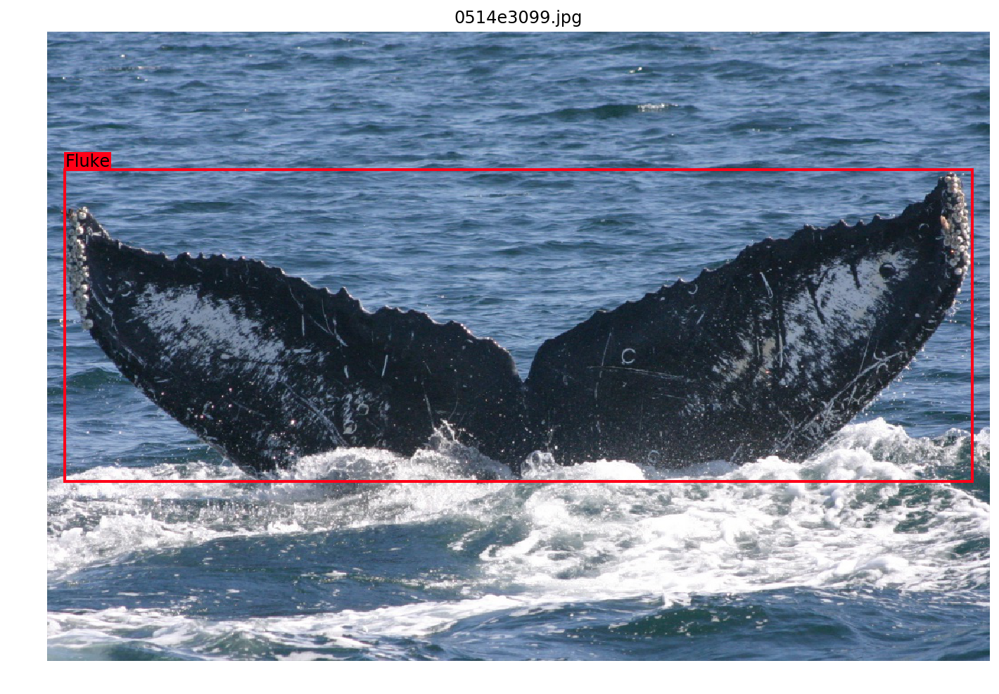

In [0]:
# You can display a specific sample from the dataset by index using:
dataset.display_sample(index=17, figsize=(12, 12))

### Display a grid of random samples

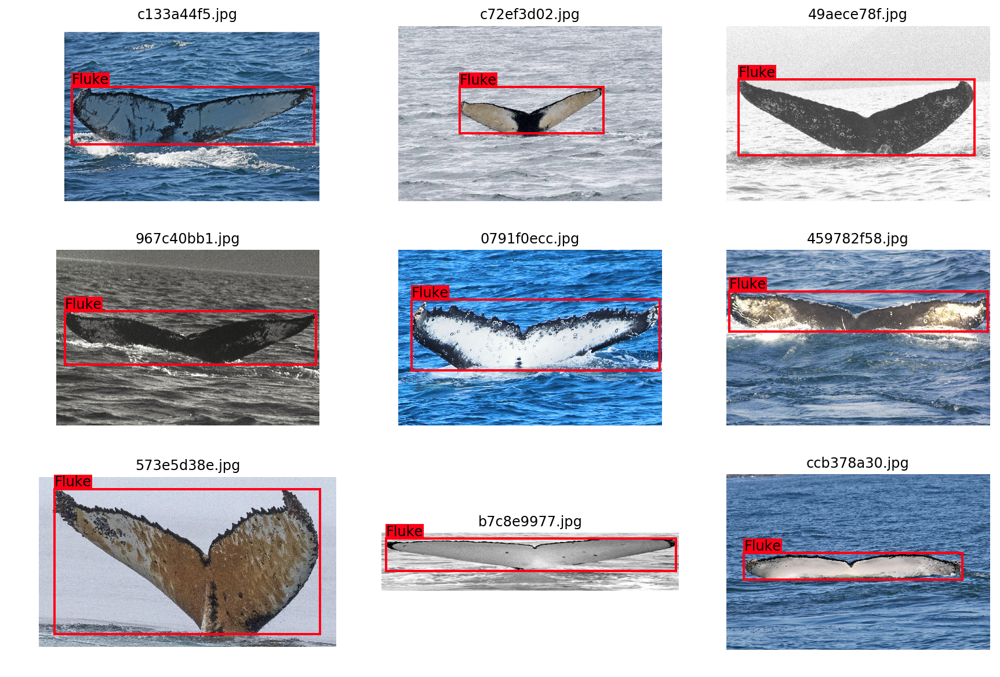

In [0]:
dataset.display_sample_grid() # Shows a 3 by 3 grid by default.

## Model

### Define Transforms and Image Augmentations


In [0]:
def get_transform(train):
    transforms = [
        T.Resize(256), # Resize images so that the shorter side of each image has length 256 and the aspect ratio remains the same.
        T.ToTensor() # Transform images to Pytorch tensors (mandatory).
    ]
  
    if train: # Apply data augmentations only while training.
        transforms.append(T.RandomHorizontalFlip(0.5)) # Perform a horizontal flip with probability 0.5.
        transforms.append(T.RandomAffine(5)) # Perform a random rotation within -5 and 5 degrees.
    return T.Compose(transforms) # Compose all transforms.

### Define Train and Test Datasets
Now we'll define the actual datasets that we'll use for training/testing incorporating the defined transforms and image augmentations.

In [0]:
dataset_w_train_transforms = VOCXMLDataset(root=data_path, transforms=get_transform(train=True))
dataset_w_test_transforms = VOCXMLDataset(root=data_path, transforms=get_transform(train=False))
print("Train:")
print(dataset_w_train_transforms)
print("\nTest:")
print(dataset_w_test_transforms)

Train:
Dataset VOCXMLDataset
    Number of datapoints: 800
    Root location: /content/drive/My Drive/Colab_ML/projects/Humpback_Fluke_Detection/data
    Number of classes: 1
    Classes: ['Fluke']
    Compose(
        Resize(size=256, interpolation=PIL.Image.BILINEAR)
        ToTensor()
        RandomHorizontalFlip(prob=0.5)
        RandomAffine(degrees=(-5, 5))
    )

Test:
Dataset VOCXMLDataset
    Number of datapoints: 800
    Root location: /content/drive/My Drive/Colab_ML/projects/Humpback_Fluke_Detection/data
    Number of classes: 1
    Classes: ['Fluke']
    Compose(
        Resize(size=256, interpolation=PIL.Image.BILINEAR)
        ToTensor()
    )


We still need to split the data into train and test samples. We'll use Pytorch's `Subset` class:

In [0]:
# Get a random permutation of the sample-indices:
indices = torch.randperm(len(dataset_w_train_transforms)).tolist()
# Split the datasets:
dataset_train = Subset(dataset_w_train_transforms, indices[:-80])
dataset_test = Subset(dataset_w_test_transforms, indices[-80:])
print(f"Train samples: {len(dataset_train)}, test samples: {len(dataset_test)}.")

Train samples: 720, test samples: 80.


*Note*: `torch.utils.data.Subset` is just wrapping our `VOCXMLDataset`. We can access a `Subset`s underlying `Dataset` by using the  `dataset` member variable. The indices of the `Subset` can be retrieved via the `indices` member:

In [0]:
print(dataset_test.dataset)
print(dataset_test.indices)

Dataset VOCXMLDataset
    Number of datapoints: 800
    Root location: /content/drive/My Drive/Colab_ML/projects/Humpback_Fluke_Detection/data
    Number of classes: 1
    Classes: ['Fluke']
    Compose(
        Resize(size=256, interpolation=PIL.Image.BILINEAR)
        ToTensor()
    )
[305, 776, 238, 135, 473, 680, 446, 289, 700, 155, 435, 91, 791, 65, 66, 285, 657, 385, 299, 472, 240, 276, 168, 677, 127, 491, 771, 580, 620, 3, 589, 629, 2, 167, 543, 367, 398, 103, 153, 774, 235, 372, 777, 366, 532, 214, 368, 95, 627, 206, 342, 358, 614, 665, 653, 738, 534, 84, 632, 638, 404, 713, 646, 158, 748, 731, 640, 523, 113, 596, 307, 296, 467, 536, 71, 223, 32, 422, 241, 102]


### Define Dataloaders
Batching of the data is done by using the Pytorch DataLoader class which wraps our Dataset.

In [0]:
BATCH_SIZE = 2
NUM_WORKERS = 0

def collate_fn(batch):
    '''Function specifiying how the batches are merged together.'''
    return tuple(zip(*batch))

dl_train = DataLoader(dataset_train, batch_size=BATCH_SIZE, 
                      shuffle=True, num_workers=NUM_WORKERS, 
                      collate_fn=collate_fn)
dl_test = DataLoader(dataset_test, batch_size=BATCH_SIZE, 
                     shuffle=False, num_workers=NUM_WORKERS, 
                     collate_fn=collate_fn)

### Create the  Model
To detect whale flukes in new images, we'll fine-tune a pre-trained [FasterRCNN model](https://pytorch.org/docs/master/_modules/torchvision/models/detection/faster_rcnn.html) from Pytorch's torchvision package. This model was pre-trained on the [COCO](http://cocodataset.org/#home) train2017 dataset to predict and locate objects in 91 different classes.  By replacing the head of the pre-trained model with a custom one which is adapted to our dataset (only 2 output classes: "Background" and "Fluke") and then training the whole model on our dataset, the model will learn to predict and locate Humpback whale flukes.

In [0]:
def create_model():
    # Get the pre-trained FasterRCNN model. 
    # For this task we're only interested in a single detection per image.
    model = fasterrcnn_resnet50_fpn(pretrained=True, box_detections_per_img=1) 

    # Get the number of input features for the classifier:
    in_features = model.roi_heads.box_predictor.cls_score.in_features

    # Replace the pre-trained head with a new one:
    # We have to pass 2 as number of classes: "Background" (Nothing) and "Fluke"
    model.roi_heads.box_predictor = FastRCNNPredictor(in_channels=in_features, 
                                                      num_classes=2)
    return model

In [0]:
# Create the model instance:
model = create_model()

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 167502836/167502836 [00:03<00:00, 52713585.75it/s]


In [0]:
# If available, train on gpu, otherwise use the cpu.
DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

print(f"Training will be performed on device: {DEVICE}")
# Move model to device:
model.to(DEVICE)

Training will be performed on device: cuda


FasterRCNN(
  (transform): GeneralizedRCNNTransform()
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d()
      (relu): ReLU(inplace)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
          (relu): ReLU(inplace)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d()
          )
        )
  

### Create an Optimizer and a Learning-Rate-Scheduler

In [0]:
LEARNING_RATE=0.01

params = [parameter for parameter in model.parameters() 
          if parameter.requires_grad]

# We'll use stochastic gradient descent with momentum 
# and regularization as optimization-method:
optimizer = torch.optim.SGD(params, lr=LEARNING_RATE,
                            momentum=0.9, weight_decay=0.001)

# We'll use a learning rate schedular that decays the learning
# rate by 0.1 every 3 steps:
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)

## Training

We'll use the functions `train_one_epoch` and `evaluate` from the [torchvision](https://github.com/pytorch/vision) github repo's `references` folder.

In [0]:
%%shell
git clone https://github.com/pytorch/vision.git
cd vision
git checkout v0.3.0

cp references/detection/utils.py ../
cp references/detection/transforms.py ../
cp references/detection/coco_eval.py ../
cp references/detection/engine.py ../
cp references/detection/coco_utils.py ../

Cloning into 'vision'...
remote: Enumerating objects: 38, done.
remote: Counting objects: 100% (38/38), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 3928 (delta 13), reused 29 (delta 11), pack-reused 3890
Receiving objects: 100% (3928/3928), 4.47 MiB | 6.82 MiB/s, done.
Resolving deltas: 100% (2542/2542), done.
Note: checking out 'v0.3.0'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by performing another checkout.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -b with the checkout command again. Example:

  git checkout -b <new-branch-name>

HEAD is now at be37608 version check against PyTorch's CUDA version


In [0]:
from engine import train_one_epoch, evaluate

NUM_EPOCHS = 12

for epoch in range(NUM_EPOCHS):
    # Train for one epoch, printing metrics every 60 iterations:
    train_one_epoch(model, optimizer, dl_train, DEVICE, epoch, print_freq=60)
    # Update the learning rate:
    lr_scheduler.step()
    # Evaluate on the test dataset:
    evaluate(model, dl_test, device=DEVICE)

Epoch: [0]  [  0/360]  eta: 0:23:45  lr: 0.000038  loss: 0.3770 (0.3770)  loss_classifier: 0.3190 (0.3190)  loss_box_reg: 0.0411 (0.0411)  loss_objectness: 0.0039 (0.0039)  loss_rpn_box_reg: 0.0130 (0.0130)  time: 3.9603  data: 1.4594  max mem: 3550
Epoch: [0]  [ 60/360]  eta: 0:11:19  lr: 0.001707  loss: 0.1167 (0.1935)  loss_classifier: 0.0385 (0.1032)  loss_box_reg: 0.0524 (0.0568)  loss_objectness: 0.0023 (0.0123)  loss_rpn_box_reg: 0.0135 (0.0211)  time: 2.2287  data: 0.6944  max mem: 4246
Epoch: [0]  [120/360]  eta: 0:08:56  lr: 0.003377  loss: 0.0547 (0.1354)  loss_classifier: 0.0193 (0.0652)  loss_box_reg: 0.0180 (0.0441)  loss_objectness: 0.0010 (0.0080)  loss_rpn_box_reg: 0.0128 (0.0181)  time: 2.2155  data: 0.6724  max mem: 4962
Epoch: [0]  [180/360]  eta: 0:06:45  lr: 0.005047  loss: 0.0418 (0.1068)  loss_classifier: 0.0131 (0.0493)  loss_box_reg: 0.0124 (0.0344)  loss_objectness: 0.0003 (0.0061)  loss_rpn_box_reg: 0.0123 (0.0171)  time: 2.3140  data: 0.7831  max mem: 4962


## Saving
We will save the learned model-parameters as well as the info DataFrames of the
train and test datasets.

In [0]:
from datetime import datetime

save_path = Path(f"/content/drive/My Drive/Colab_ML/projects/Humpback_Fluke_Detection/models/run_{datetime.now().strftime('%Y-%m-%d')}")
save_path.mkdir()

In [0]:
# Save the learned parameters:
torch.save(model.state_dict(), save_path / "frcnn_resnet50.pt")

# Save the info_df entries of the used training and testing samples:
dataset_w_train_transforms.info_df.iloc[dataset_train.indices].to_csv(save_path / "train_info_df.csv")   
dataset_w_test_transforms.info_df.iloc[dataset_test.indices].to_csv(save_path / "test_info_df.csv")

## (optional) Loading

In [0]:
load_path = project_root / "models/run_2019-08-02"
!ls "{load_path.resolve()}"

frcnn_resnet50.pt  test_info_df.csv  train_info_df.csv


In [0]:
# Create model:
model = create_model()

# Move to device:
model.to(DEVICE)

# Load parameters:
model.load_state_dict(torch.load(load_path / "frcnn_resnet50.pt"))

IncompatibleKeys(missing_keys=[], unexpected_keys=[])

In [0]:
# Create test dataset for evaluation using the image_ids in the saved test datasets info_df:
saved_test_info_df = pd.read_csv(load_path / "test_info_df.csv", index_col=0)
saved_test_info_df.head()

,filename,width,height,nr_boxes,classes
305,4f7706e20.jpg,1050,592,1,{'Fluke'}
776,ca38267c0.jpg,1050,700,1,{'Fluke'}
238,3f4ea06c7.jpg,1050,712,1,{'Fluke'}
135,2385c8427.jpg,1050,600,1,{'Fluke'}
473,818832ed1.jpg,2690,632,1,{'Fluke'}


In [0]:
# Create a subset of the whole dataset (with test transforms) using the indices
# of saved_test_info_df:
dataset_test = Subset(dataset_w_test_transforms, saved_test_info_df.index)

## Results
After having trained the model on the Humpback Fluke data, we can now check how good the model is at predicting the location of flukes in images it has not yet encountered. `VOCXMLDataset` includes methods to show the ground truth bounding boxes as well as the predicted boxes, its predicted class, the classification score (showing how *confident* the classifier is that a certain object belongs to the indicated class) and the maximum (with respect to all ground truth boxes) *intersection-over-union* (IOU)-score (also called [Jaccard i
ndex](https://en.wikipedia.org/wiki/Jaccard_index)).

In [0]:
# Get the test set sample indices:
test_indices = dataset_test.indices

### Display single sample prediction

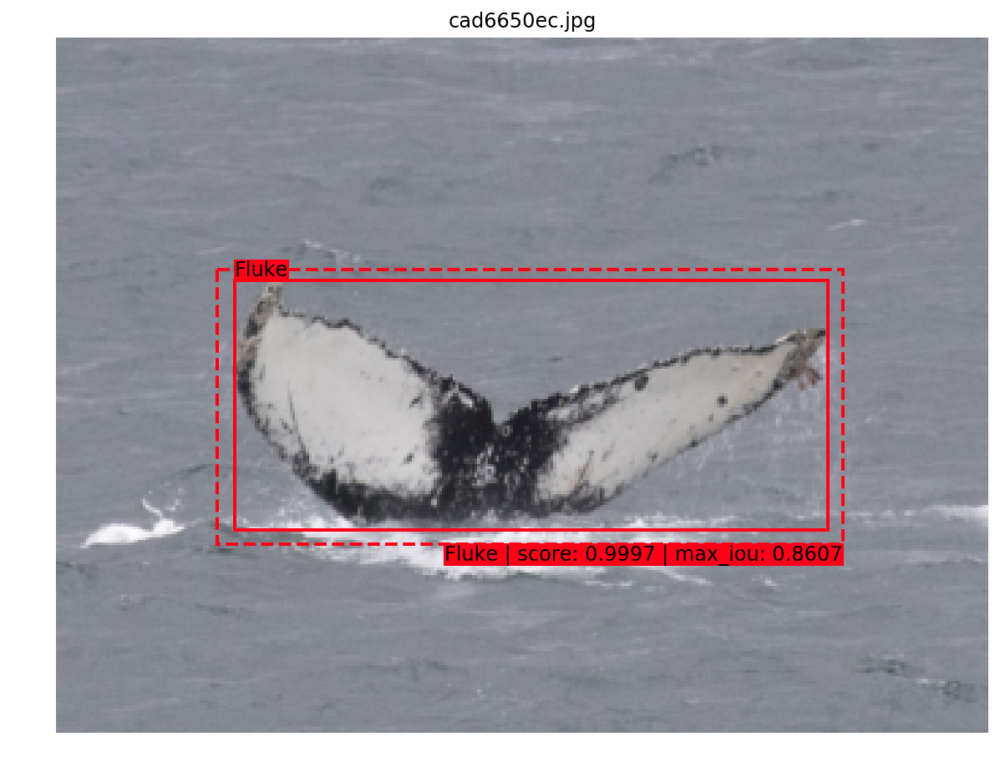

In [0]:
dataset_w_test_transforms.display_annotation_and_prediction(index=test_indices[42], model=model)

This shows the ground truth box (with a solid line) and its class as well as
the predicted box (with a dashed line) and the predicted class and the metrics.

### Display grid of sample predictions

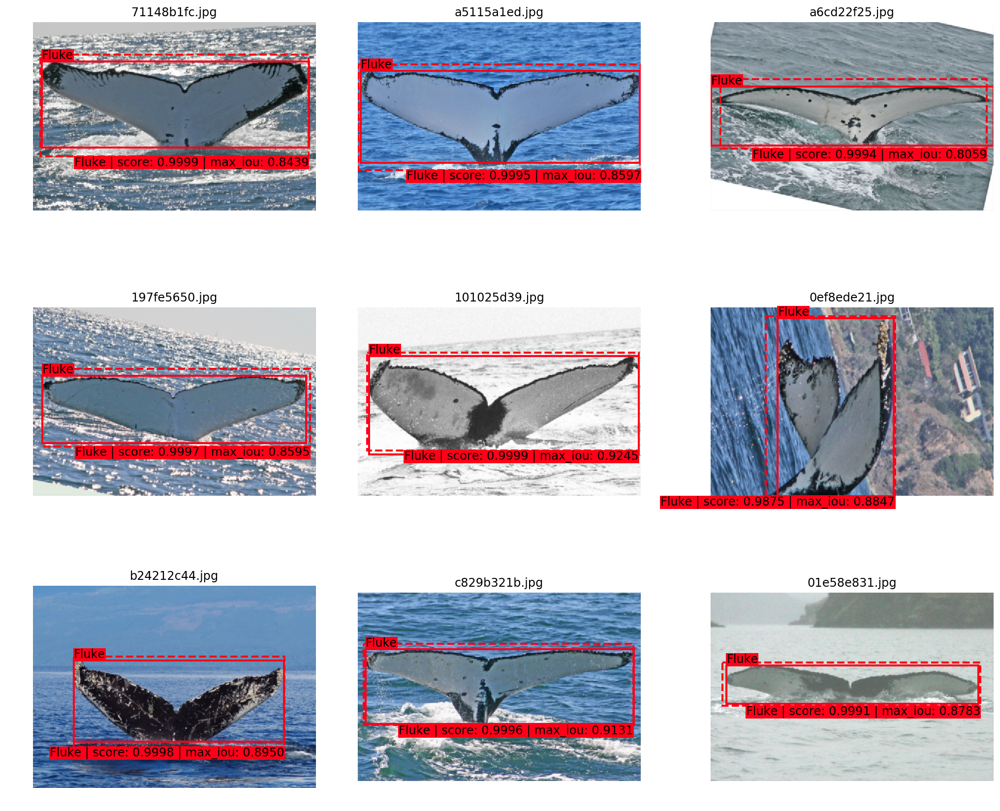

In [0]:
grid_rows = 3
grid_cols = 3

# Pick some indices at random:
chosen_indices = np.random.choice(test_indices, grid_rows * grid_cols)

dataset_w_test_transforms.display_annotation_and_prediction_grid(model, 
                                                                 rows=grid_rows, 
                                                                 cols=grid_cols, 
                                                                 indices=chosen_indices, 
                                                                 figsize=(14, 12))

### Calculate prediction metrics for all test samples
`VOCXMLDataset` has a `get_prediction_metrics_df()` method which evaluates a passed samples using a passed in model and returns the results in a pandas DataFrame. 

In [0]:
metrics_df = dataset_w_test_transforms.get_prediction_metrics_df(model, indices=test_indices)

In [0]:
metrics_df.head()

,filename,classes,scores,max_ious
image_id,,,,
305,4f7706e20.jpg,[Fluke],[0.99963653],[0.81090766]
776,ca38267c0.jpg,[Fluke],[0.9998536],[0.91366154]
238,3f4ea06c7.jpg,[Fluke],[0.9996861],[0.791705]
135,2385c8427.jpg,[Fluke],[0.9998671],[0.82307]
473,818832ed1.jpg,[Fluke],[0.99954623],[0.85080713]


*Note:* The entriey of the columns `classes`, `scores` and `max_ious` are lists, because in general there can be more than one predicted bounding box for a single image. All subsequent statistics calculations also work in this general case.

In [0]:
# Mean score over all class-predictions:
metrics_df.scores.apply(np.mean).mean()

0.9994867272675038

In [0]:
# Mean max_iou over all predicted boxes:
metrics_df.max_ious.apply(np.mean).mean()

0.8674952954053878

### Display predictions with the worst IOU scores
We might be interested in the samples whose predicted boxes exhibit the lowest maximum IOU-scores. This can be done using the `metrics_df` DataFrame.

In [0]:
# Sort by max_iou scores:
metrics_df_sorted_by_max_ious = metrics_df.sort_values("max_ious")

In [0]:
metrics_df_sorted_by_max_ious.head()

,filename,classes,scores,max_ious
image_id,,,,
491,856f69c66.jpg,[Fluke],[0.99883693],[0.68497646]
127,21eeba83a.jpg,[Fluke],[0.9999261],[0.73088497]
738,c0099d04f.jpg,[Fluke],[0.99955386],[0.7849998]
168,2cc931563.jpg,[Fluke],[0.99976236],[0.78861034]
214,3873f4932.jpg,[Fluke],[0.9995433],[0.791133]


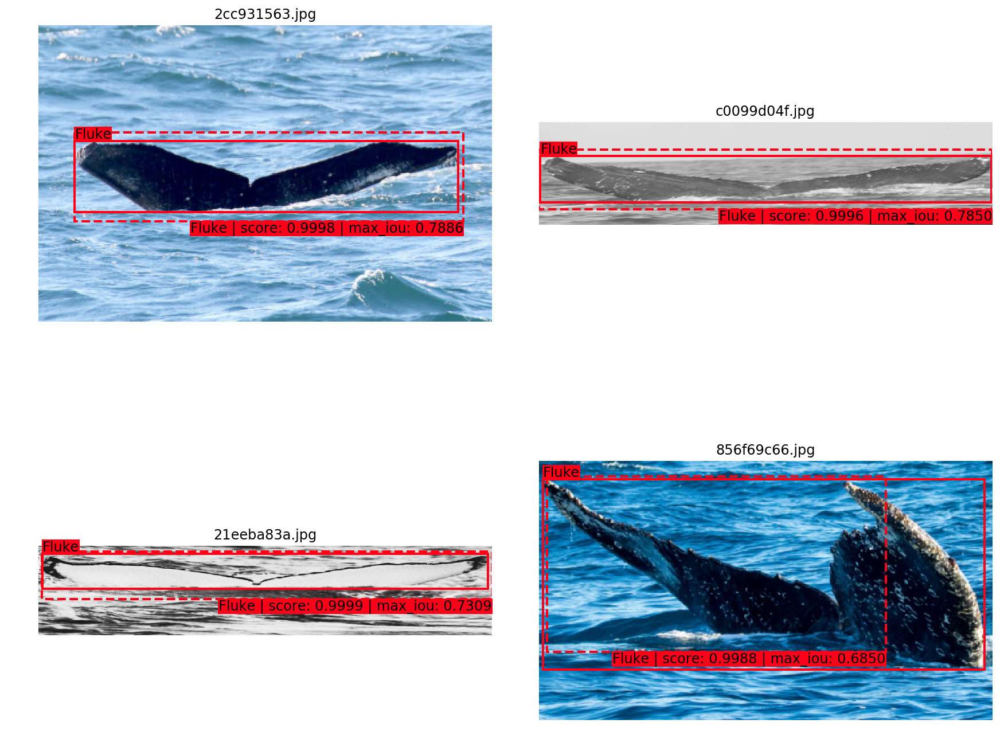

In [0]:
dataset_w_test_transforms.display_annotation_and_prediction_grid(model, rows=2, cols=2,
                                                                 indices=metrics_df_sorted_by_max_ious[:4].index)

Some reasons for the poorer performance of the model-prediction of the fluke location in these samples might be abnormal aspect ratio or contrast (c0099d04f.jpg and 21eeba83a.jpg), a possibly abnormal angle of the whale fluke (856f69c66.jpg) or a partially occluded fluke (2cc931563.jpg).

### Display predictions with the best IOU scores

Last but not least, let's display the samples whose predicted boxes have the highest maximum IOU-scores.

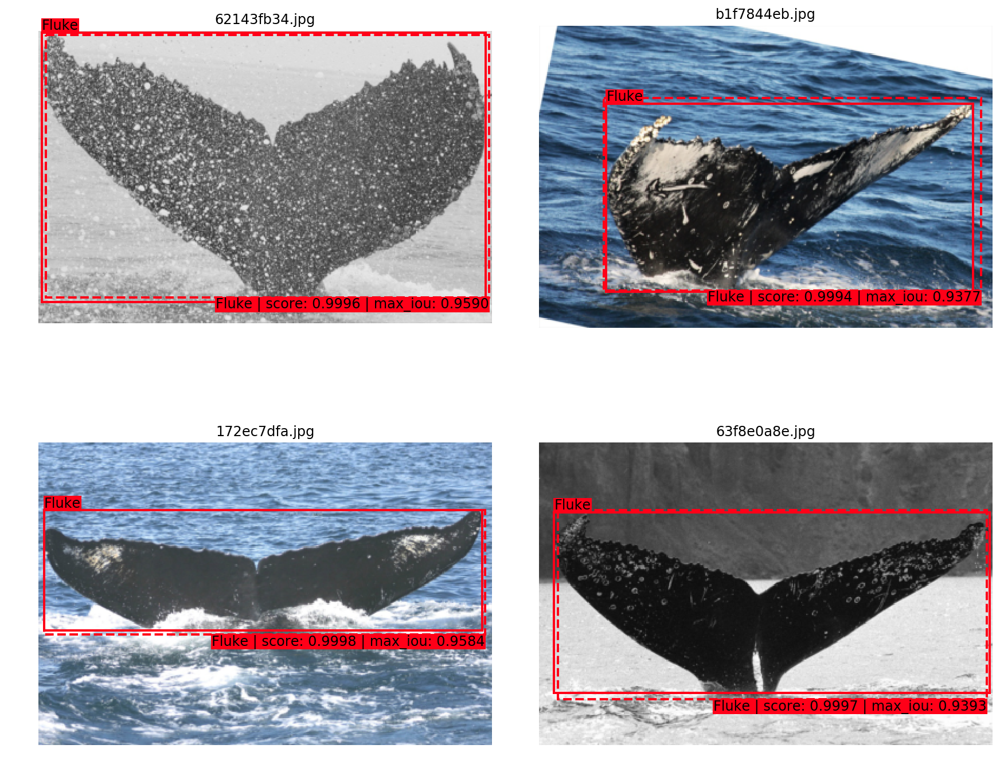

In [0]:
dataset_w_test_transforms.display_annotation_and_prediction_grid(model, rows=2, cols=2,
                                                                 indices=metrics_df_sorted_by_max_ious[-4:].index)

The flukes in these samples are prominently positioned and quite clearly outlined. The model was able to predict their bounding boxes very accurately.